# Wine Quality (Ordinal Regression)
## Data Cleaning, Exploration and Wrangling

### Source
- https://archive.ics.uci.edu/ml/datasets/Wine+Quality
- http://www3.dsi.uminho.pt/pcortez/wine/

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline

In [2]:
df_rd = pd.read_csv('lake/wine_quality/winequality-red.csv', sep=';')
df_wt = pd.read_csv('lake/wine_quality/winequality-white.csv', sep=';')
print(df_rd.shape, df_wt.shape)

(1599, 12) (4898, 12)


In [3]:
df_rd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [4]:
df_rd['type'] = 'red'
df_wt['type'] = 'white'

In [5]:
df = pd.concat([df_rd, df_wt], axis=0).reindex()

In [6]:
print(df.columns)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'type'],
      dtype='object')


In [7]:
num_features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
                'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
                'pH', 'sulphates', 'alcohol', 'quality']
df[num_features].describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


<AxesSubplot:>

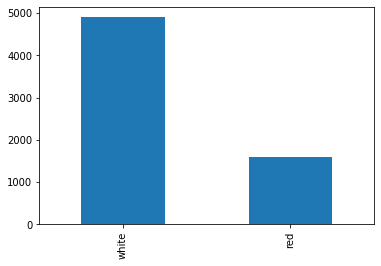

In [8]:
df.type.value_counts().plot.bar()

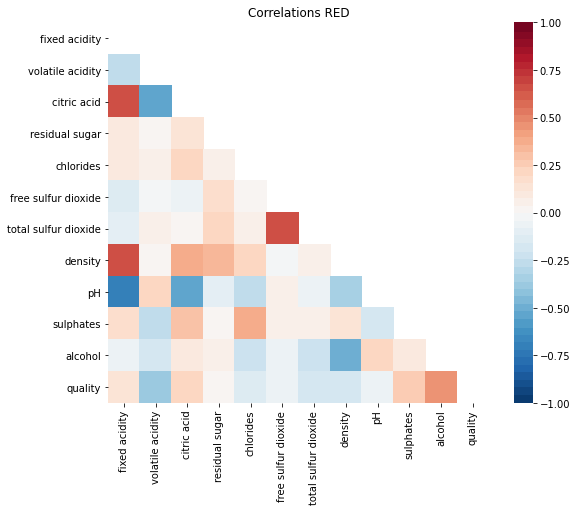

In [9]:
def plot_corr_mat(data, title):
    correlations = data[num_features].corr()
    mask = np.zeros_like(correlations)
    mask[np.triu_indices_from(mask)] = True
    plt.subplots(figsize=(9, 7)); plt.title(title) 
    sns.heatmap(correlations, vmin=-1, vmax=1, mask=mask,
                square=True, center=0, cmap=sns.color_palette("RdBu_r", 50))
plot_corr_mat(df_rd, "Correlations RED")

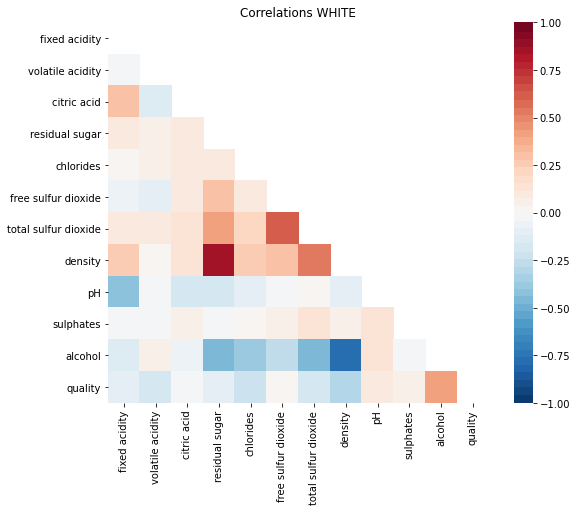

In [10]:
plot_corr_mat(df_wt, "Correlations WHITE")

In [11]:
from pandas_profiling import ProfileReport
# profile = ProfileReport(df_wt, title="Pandas Profiling Report")
# profile

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.35s/it]


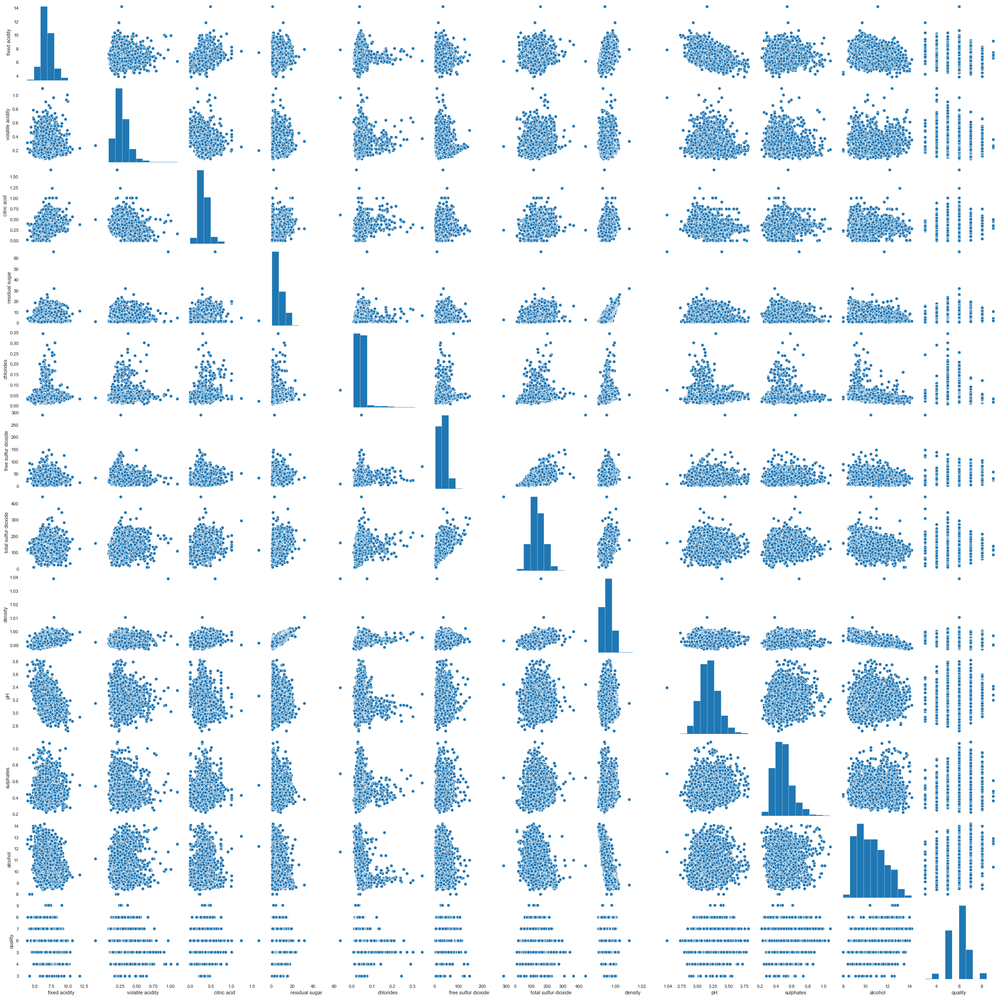

In [12]:
# sns.pairplot(df_wt)

## Building Models
### White Wine

In [17]:
# Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
pd.options.display.float_format = "{:,.2f}".format

In [14]:
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
            'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
            'pH', 'sulphates', 'alcohol']
X = df_wt[features]
y = df_wt.quality
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=25)
print(X_train.shape, X_test.shape)
print(y_test.shape, y_test.shape)

(3673, 11) (1225, 11)
(1225,) (1225,)


In [15]:
# Raw Features
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
pd.DataFrame({'Actuals': y_test, 'Predictions': y_pred})

,Actuals,Predictions
2384,8,5.98
3677,6,6.02
2080,5,5.14
2578,7,6.76
401,5,5.35
...,...,...
1148,6,6.13
228,6,5.83
2627,7,6.08
1527,6,5.90


(MAE) Mean absolute error: 0.58
(MSE) Mean squared error: 0.56
(R2) Coefficient of determination: 0.28


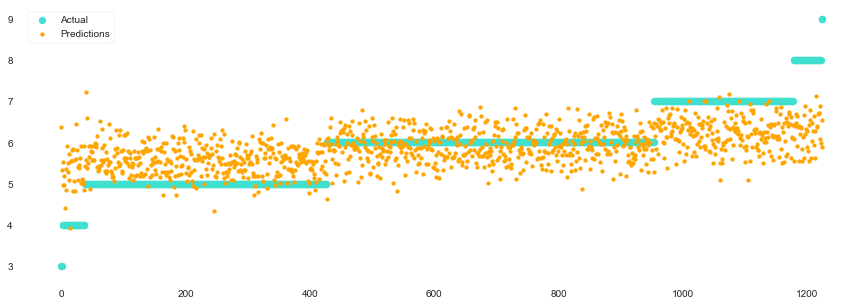

In [16]:
def evaluate(y_test, y_pred):
    print('(MAE) Mean absolute error: %.2f' % mean_absolute_error(y_test, y_pred))
    print('(MSE) Mean squared error: %.2f' % mean_squared_error(y_test, y_pred))
    print('(R2) Coefficient of determination: %.2f' % r2_score(y_test, y_pred))
    
    a = np.concatenate((y_test.values.reshape(-1,1), y_pred.reshape(-1,1)), axis=1)
    a = a[a[:,0].argsort()]

    fig, ax = plt.subplots(figsize=(15,5))
    x_ticks = range(y_test.shape[0])
    ax.scatter(x_ticks, a[:,0], label='Actual', c='turquoise')
    ax.scatter(x_ticks, a[:,1], label='Predictions', s=15, c='orange');
    ax.legend()
evaluate(y_test, y_pred)

In [19]:
# SVR

from sklearn.preprocessing import StandardScaler
xscaler = StandardScaler(); x_test_scaler = StandardScaler()
yscaler = StandardScaler(); y_test_scaler = StandardScaler()
X_train_sc = xscaler.fit_transform(X_train)
y_train_sc = yscaler.fit_transform(y_train.values.reshape(-1,1))
X_test_sc = x_test_scaler.fit_transform(X_test)
y_test_sc = y_test_scaler.fit_transform(y_test.values.reshape(-1,1))

In [20]:
from sklearn.svm import SVR
svr = SVR(kernel='rbf')
svr.fit(X_train_sc, y_train_sc.ravel())

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [22]:
y_pred_sc = svr.predict(X_test_sc)
y_pred = y_test_scaler.inverse_transform(y_pred_sc)
pd.DataFrame({'Actuals': y_test, 'Predictions': y_pred})

,Actuals,Predictions
2384,8,6.07
3677,6,6.31
2080,5,5.30
2578,7,7.03
401,5,5.03
...,...,...
1148,6,6.18
228,6,5.90
2627,7,6.34
1527,6,5.92


(MAE) Mean absolute error: 0.52
(MSE) Mean squared error: 0.47
(R2) Coefficient of determination: 0.40


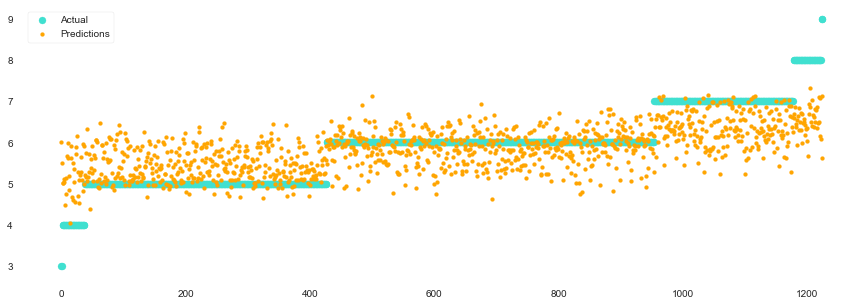

In [23]:
evaluate(y_test, y_pred)